In [1]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score, LeaveOneOut, KFold, cross_validate
from sklearn.metrics import accuracy_score
from scipy import linalg
import numpy as np
import pandas as pd
import tqdm

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Setup

In [2]:
from utils import *

plt.rc('legend', frameon=False)
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_style("white", rc=custom_params)
sns.set_palette("pastel")

## Plotting functions

In [3]:
def plot_auc(auc):
    plt.imshow(auc, aspect='auto', cmap='rocket')
    plt.ylabel('Neurons')
    plt.xlabel('Trials')
    plt.title('AUC of df/f per trial')
    plt.colorbar(label='AUC (df/f)')
    plt.show()

In [4]:
def plot_correlation_heatmap(df_test_acc):
    correlation_matrix = df_test_acc.corr()
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, 
                vmin=-1, vmax=1, square=True)
    plt.title('Correlation between Target Decoding Accuracies')
    plt.tight_layout()
    plt.show()

In [5]:
def plot_pairwise(result, title=""):
    
    # Custom function to add diagonal and chance lines
    def add_reference_lines(x, y, **kwargs):
        ax = plt.gca()
        # Diagonal line
        ax.plot([0, 1], [0, 1], 'k--', alpha=0.3, linewidth=1)
        # Chance lines
        chance = 0.5
        ax.axhline(chance, color='k', linestyle='--', alpha=0.3, linewidth=1)
        ax.axvline(chance, color='k', linestyle='--', alpha=0.3, linewidth=1)
        # Scatter
        ax.scatter(x, y, alpha=0.2, s=10, marker='.', color='k')

    # Create pairplot with custom styling
    g = sns.pairplot(result, 
                    diag_kind='hist',
                    plot_kws={'alpha': 0.2, 's': 50, 'marker': '.', 'color': 'k'},
                    diag_kws={'color': 'k', 'alpha': 0.5},
                    corner=False,
                    height=3)  # Size of each subplot (default is 2.5)

    # Add reference lines to each subplot
    g.map_offdiag(add_reference_lines)

    # Set limits and grid for all subplots
    for ax in g.axes.flatten():
        if ax is not None:
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)
            ax.grid(alpha=0.3)
            # Increase tick label size
            ax.tick_params(labelsize=10)

    # Increase axis label size
    for ax in g.axes[-1,:]:  # Bottom row (x-labels)
        ax.xaxis.label.set_size(12)
    for ax in g.axes[:,0]:   # Left column (y-labels)
        ax.yaxis.label.set_size(12)

    plt.suptitle(title, y=1.02, fontsize=14)
    plt.tight_layout()
    # set dpi 300
    plt.gcf().set_dpi(300)
    plt.show()

## Analysis

In [6]:
def single_neuron_decoding(auc, trials_table):
    """
    
    Different targets to decode:

    $$\text{CTX}^{AB}_{trial} = \beta_0 + \beta_1 \cdot \text{AUC}[\text{df/f}_{trial}]$$
    $$\text{CTX}^{CD}_{trial} = \beta_0 + \beta_1 \cdot \text{AUC}[\text{df/f}_{trial}]$$
    $$\text{RW}_{trial} = \beta_0 + \beta_1 \cdot \text{AUC}[\text{df/f}_{trial}]$$
    $$\text{WATER}_{trial} = \beta_0 + \beta_1 \cdot \text{AUC}[\text{df/f}_{trial}]$$
    $$\text{LICK}_{trial} = \beta_0 + \beta_1 \cdot \text{AUC}[\text{df/f}_{trial}]$$

    """
    
    ab_mask = (trials_table.context.values == 'ctxA') | (trials_table.context.values == 'ctxB')
    cd_mask = (trials_table.context.values == 'ctxC') | (trials_table.context.values == 'ctxD')

    target_names = [
        'context_ab', 
        'context_cd', 
        'reward_trial', 
        'water', 
        'lick_or_not'
    ]

    target_datas = [
        trials_table.context.values,
        trials_table.context.values,
        trials_table.reward_trial.values,
        trials_table.water.values,
        trials_table.lick_or_not.values
    ]

    trial_masks = [
        ab_mask,
        cd_mask,
        np.ones(len(trials_table), dtype=bool),
        np.ones(len(trials_table), dtype=bool),
        np.ones(len(trials_table), dtype=bool)
    ]


    results = []
    for neuron_idx in tqdm.tqdm(range(auc.shape[0])):
        
        
        for target_name, target_data, trial_mask in zip(target_names, target_datas, trial_masks):
            
            neuron_auc = auc[neuron_idx, trial_mask].reshape(-1, 1)
            
            model = LogisticRegression(max_iter=1000)
            kfold = KFold(n_splits=5, shuffle=True, random_state=42)
            
            scoring = {
                'accuracy': 'accuracy',
                'roc_auc': 'roc_auc_ovr',
            }
            
            cv_results = cross_validate(model, 
                                        neuron_auc, 
                                        target_data[trial_mask], 
                                        cv=kfold, 
                                        scoring=scoring, 
                                        return_train_score=True)
            
            results.append({
                'neuron': neuron_idx,
                'target': target_name,
                'train_acc': cv_results['train_accuracy'].mean(),
                'test_acc': cv_results['test_accuracy'].mean(),
                'train_auc': cv_results['train_roc_auc'].mean(),
                'test_auc': cv_results['test_roc_auc'].mean(),
            })

    return pd.DataFrame(results)

Mouse: ek045, Trial ID: 34941, Area: CA1
ICRWL.h5 is successfully loaded
place_maps.pkl is successfully loaded


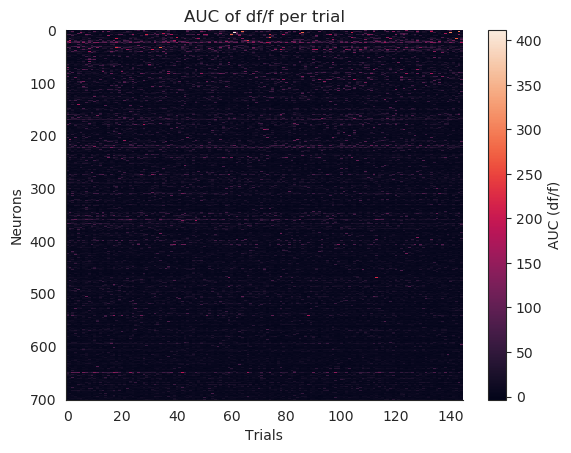

100%|██████████| 702/702 [02:03<00:00,  5.67it/s]


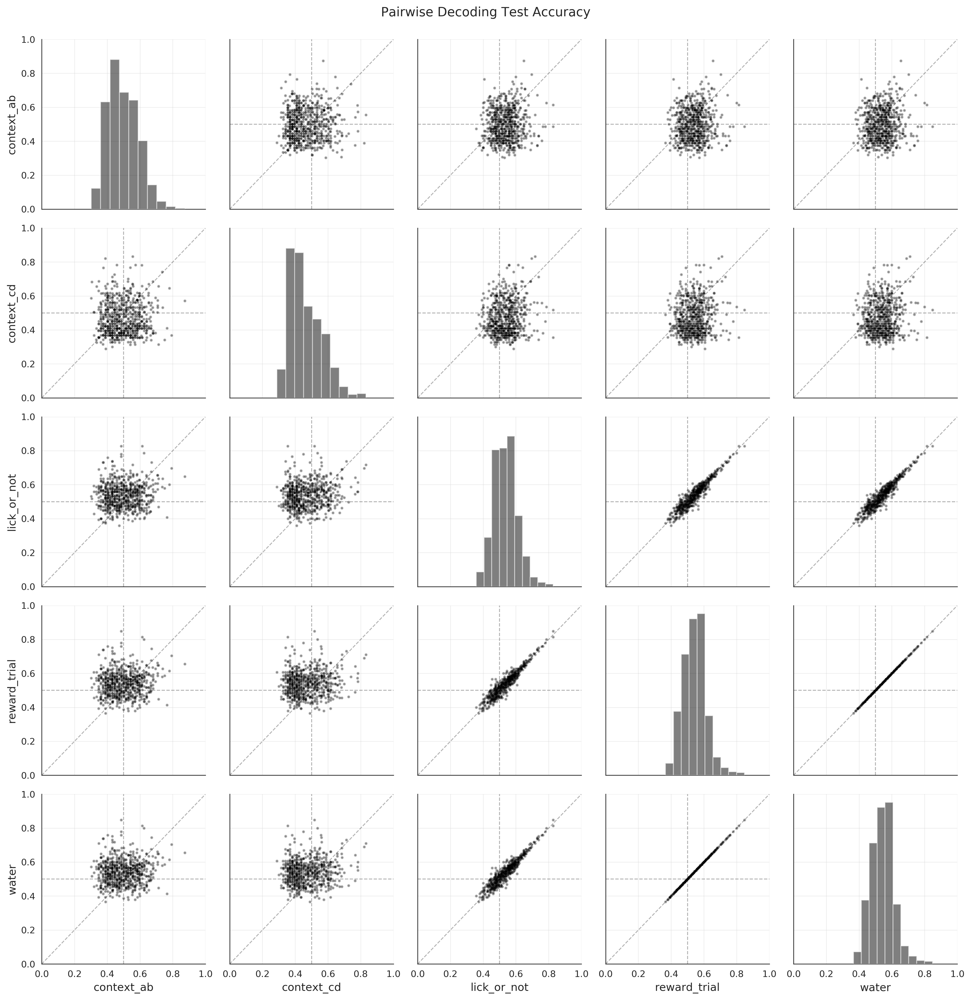

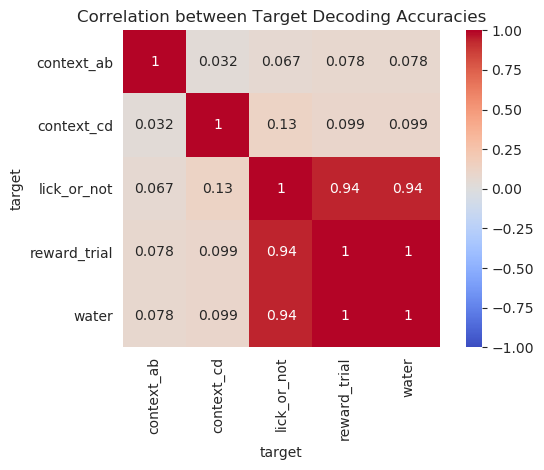

Mouse: ek045, Trial ID: 34948, Area: CA1
ICRWL.h5 is successfully loaded
place_maps.pkl is successfully loaded


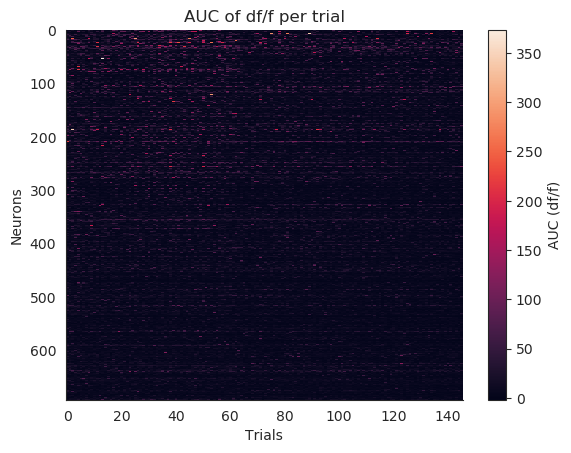

100%|██████████| 693/693 [02:03<00:00,  5.62it/s]


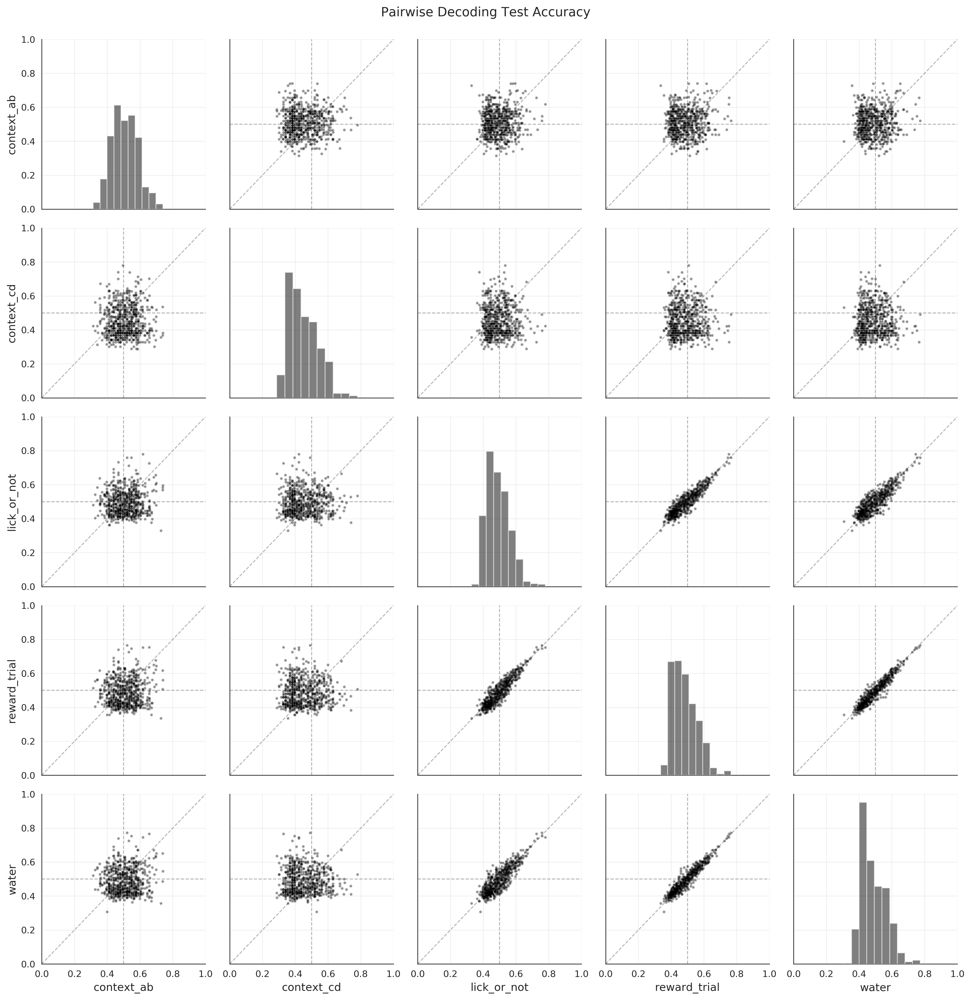

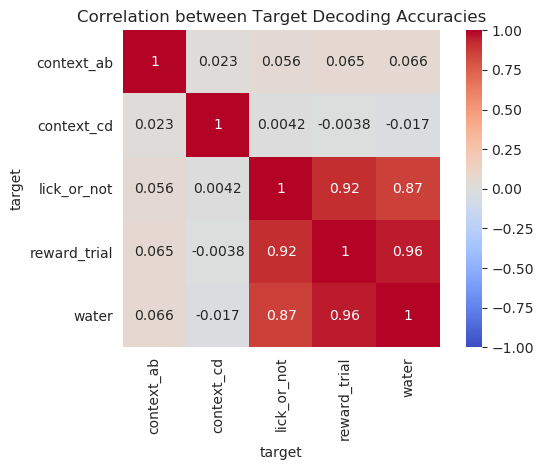

Mouse: ek154, Trial ID: 37231, Area: CA1
ICRWL.h5 is successfully loaded
place_maps.pkl is successfully loaded


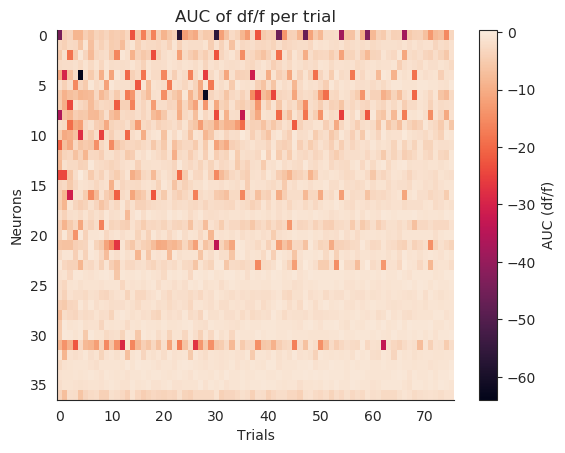

100%|██████████| 37/37 [00:06<00:00,  5.93it/s]


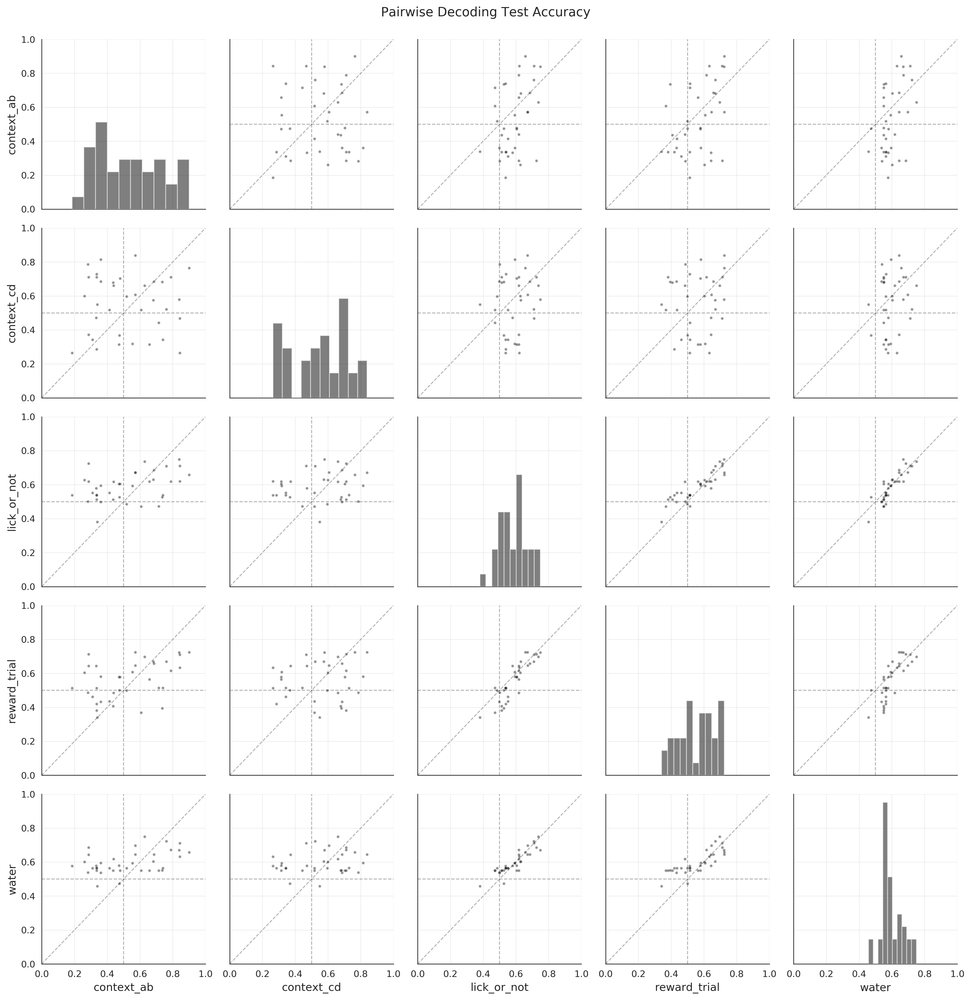

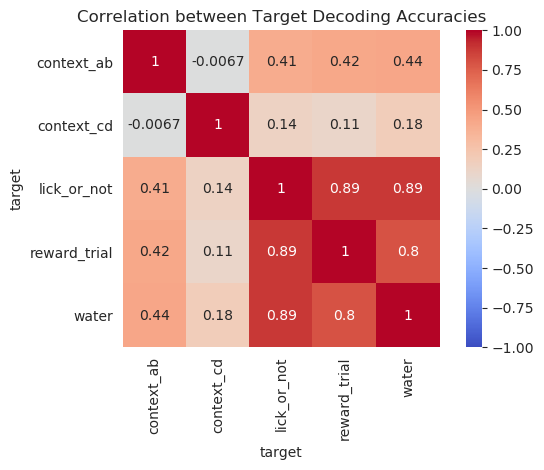

Mouse: ek154, Trial ID: 37266, Area: CA1
ICRWL.h5 is successfully loaded
place_maps.pkl is successfully loaded


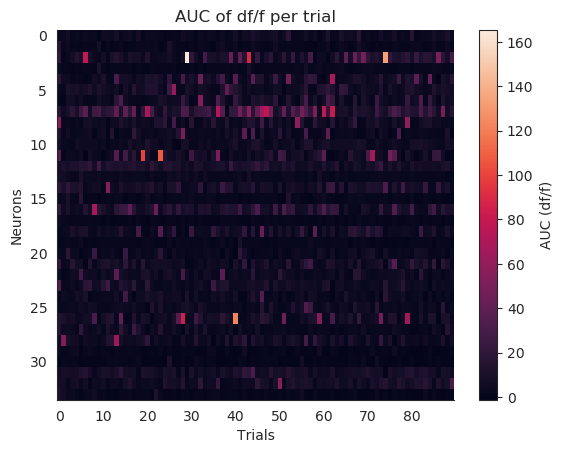

100%|██████████| 34/34 [00:05<00:00,  5.79it/s]


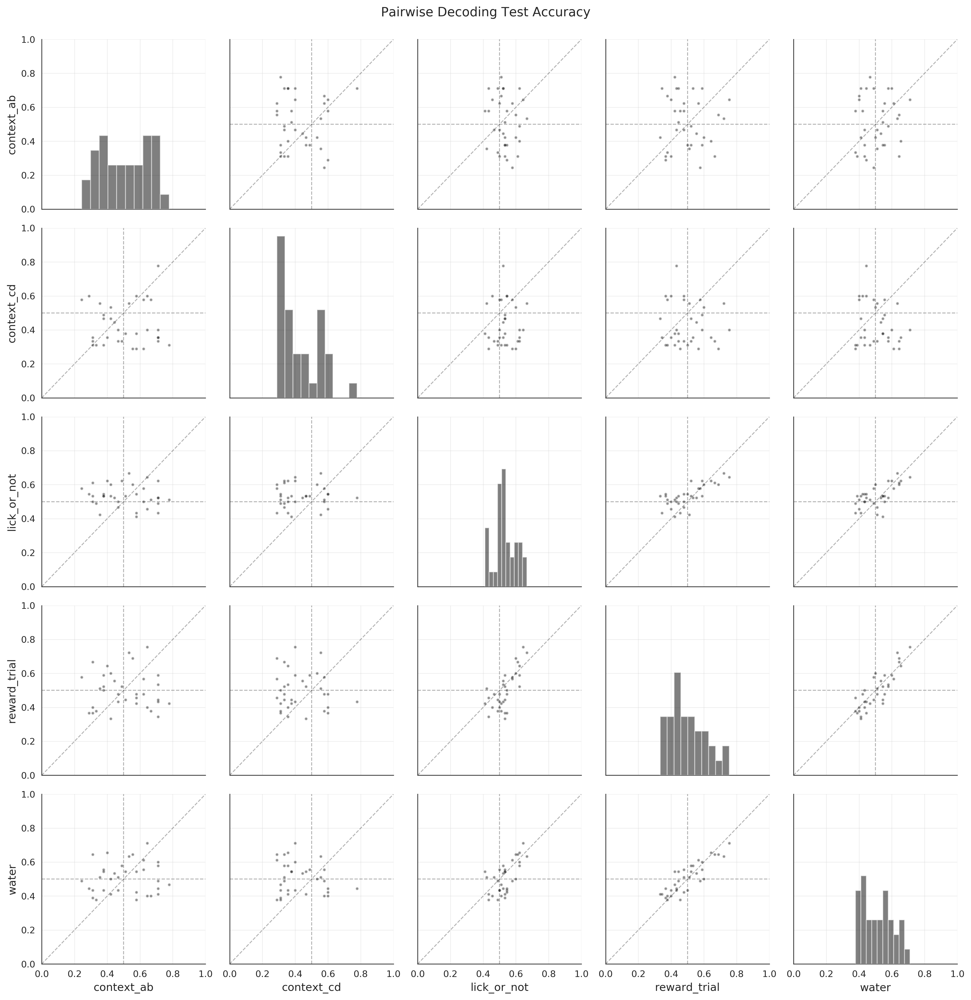

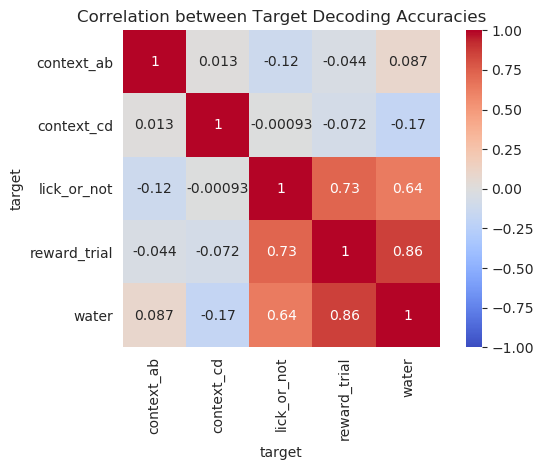

Mouse: ek293, Trial ID: 40072, Area: CA3
ICRWL.h5 is successfully loaded
place_maps.pkl is successfully loaded


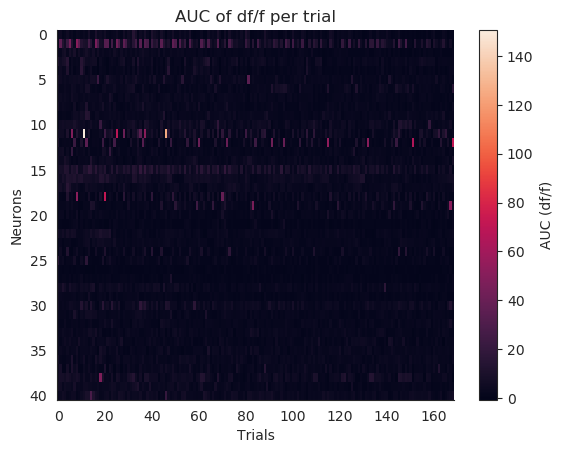

100%|██████████| 41/41 [00:06<00:00,  5.94it/s]


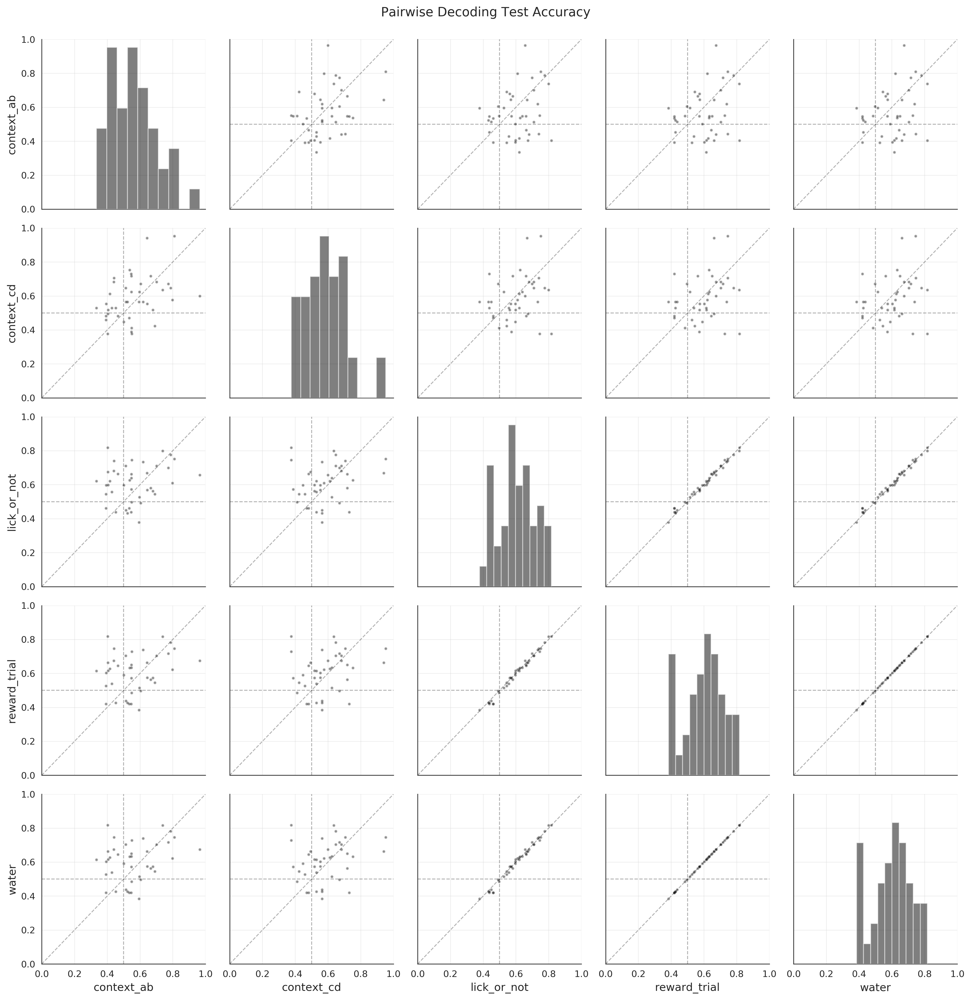

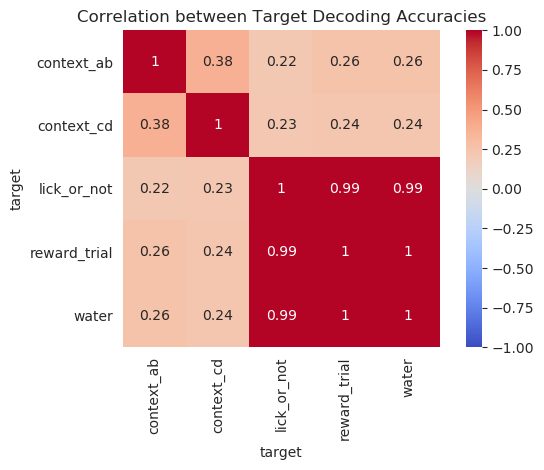

Mouse: ek293, Trial ID: 40161, Area: CA3
ICRWL.h5 is successfully loaded
place_maps.pkl is successfully loaded


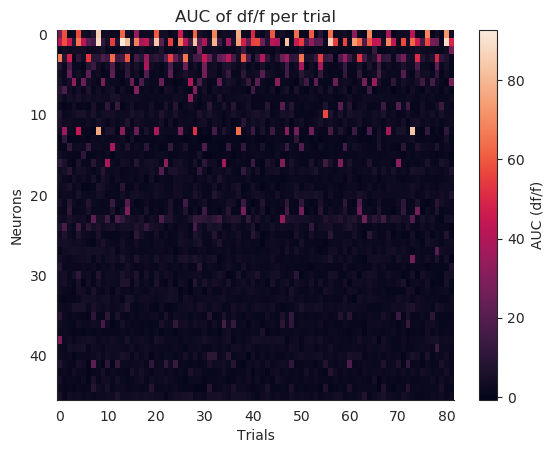

100%|██████████| 46/46 [00:08<00:00,  5.55it/s]


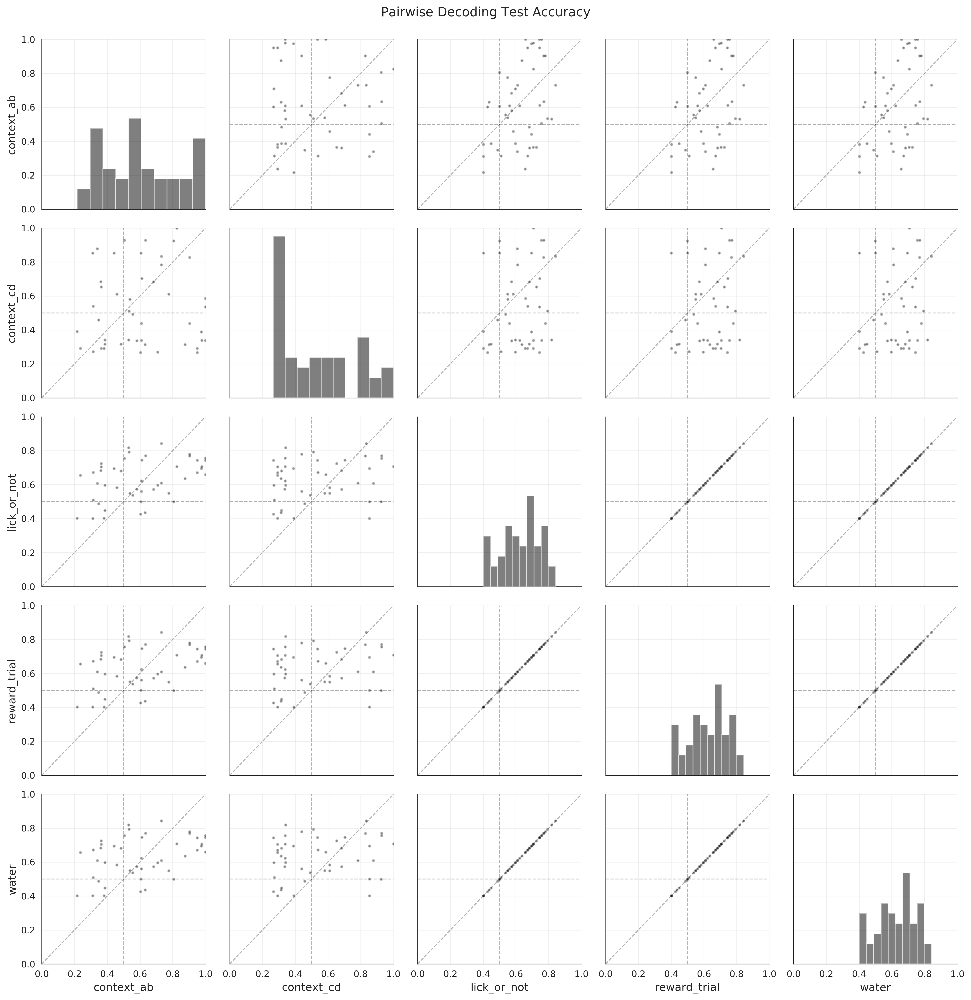

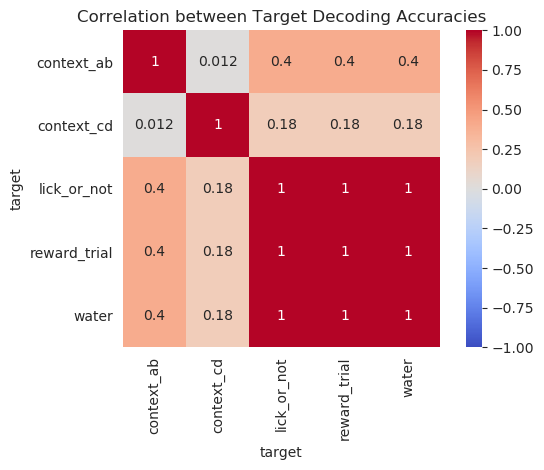

Mouse: ek339, Trial ID: 41169, Area: CA1
ICRWL.h5 is successfully loaded
place_maps.pkl is successfully loaded


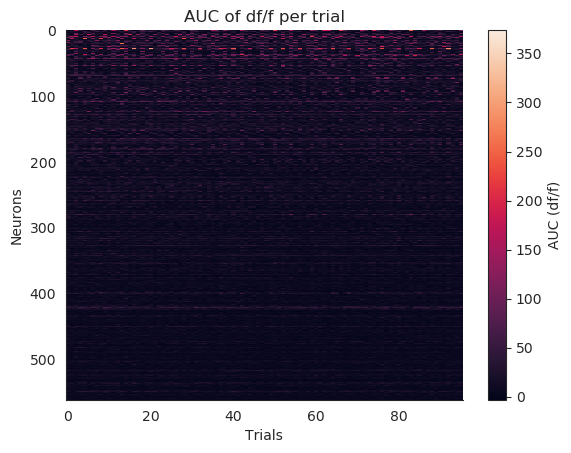

100%|██████████| 562/562 [01:45<00:00,  5.35it/s]


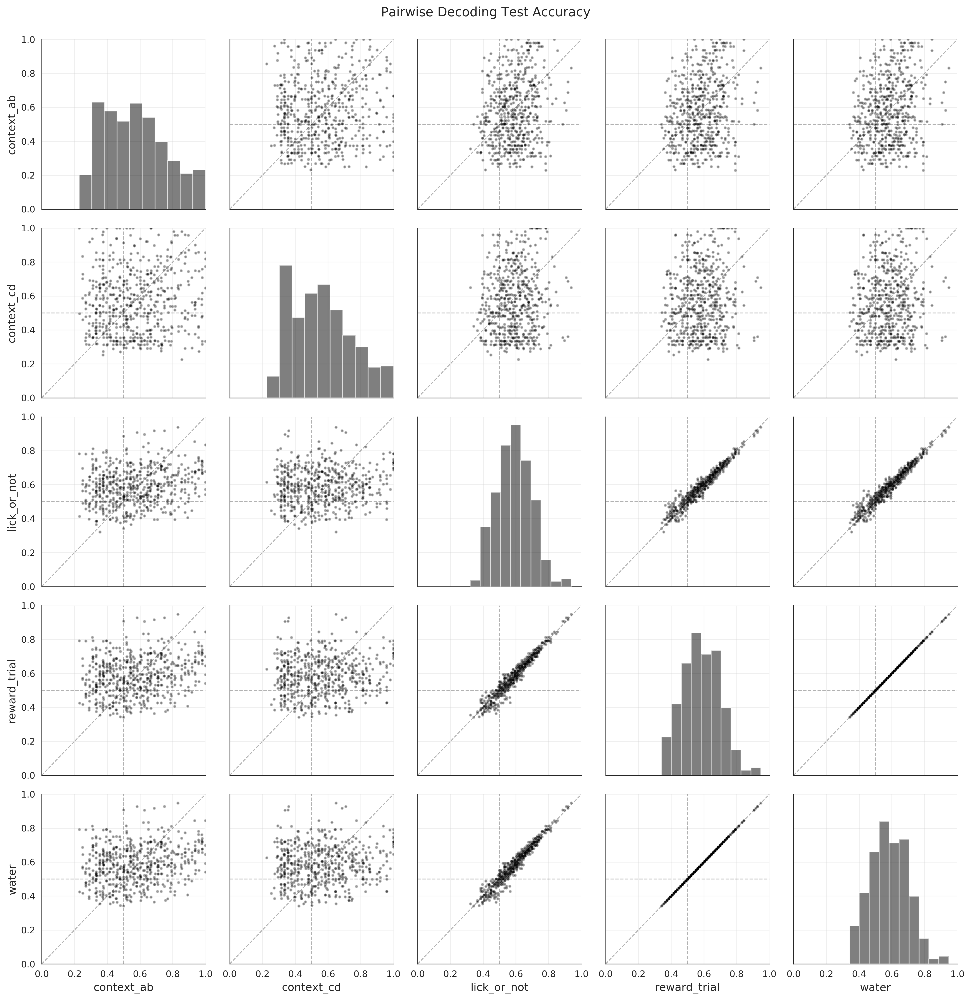

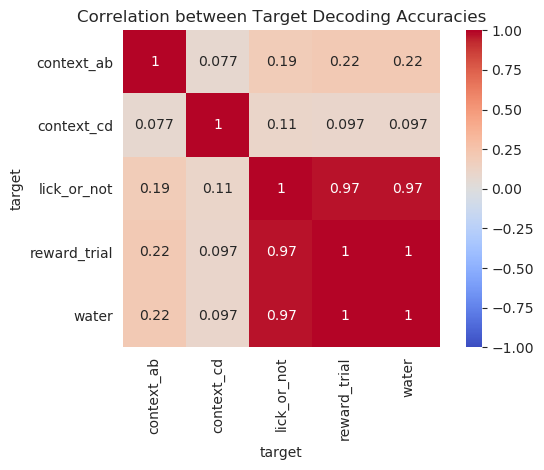

In [7]:

for index, row in df_experiments.iterrows():
    print(f"Mouse: {row['mouse_id']}, Trial ID: {row['trial_id']}, Area: {row['area']}")
    
    # Lets read
    mouse = Mouse.from_database(
        trial_id=row['trial_id'],
        mouse_name=row['mouse_id'],
        expt_class=ImagingExperiment
    ) # returns df
    expt = mouse[0] # df
    bd_exp = expt.format_behavior_data() # dict
    # for key in bd_exp.keys(): print(key)
    
    # Get or Make ICRWL and place maps
    ICRWL = get_or_make_ICRWL(expt, bd_exp)
    place_maps, smooth_place_maps = get_or_make_place_maps(expt)
    
    trials_table = ICRWL.reset_index()[['lap_index', 'context', 'reward_trial', 'water', 'lick_or_not']]
    
    # Cropping cuz smooth place maps records more trails than behavioral data
    dfof = smooth_place_maps[:,:len(trials_table), :]
    auc = np.trapz(dfof, axis=2)
    plot_auc(auc)
    
    # Core analysis
    df_results = single_neuron_decoding(auc, trials_table)
    
    # Plot the results
    df_test_acc = df_results.pivot(index='neuron', columns='target', values='test_acc')
    plot_pairwise(df_test_acc, title="Pairwise Decoding Test Accuracy")
    plot_correlation_heatmap(df_test_acc)